# Split scanned photos

The purpose of this notebook is to play with OpenCV and python to find ways to reliably indentify and cut scanned photos from one image. 

## Imports

In [47]:
import cv2
from matplotlib import pyplot as plt
import matplotlib
import math 
import numpy as np
import itertools

# show larger images and inline 
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (20.0, 20.0)


## constants

In [48]:
GREEN = (0, 255, 0)
BLUE = (255, 0, 0)

## Read the image

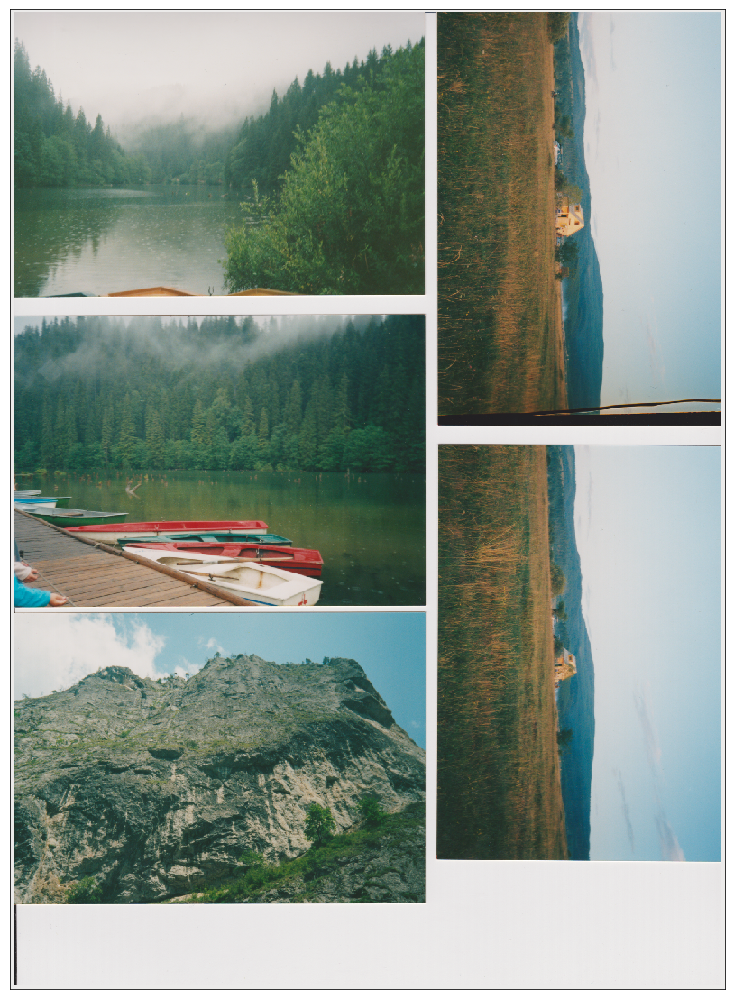

In [49]:
img = cv2.imread("test2b.png")
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
_ = plt.xticks([]), plt.yticks([])
plt.show()

## Convert to grayscale 

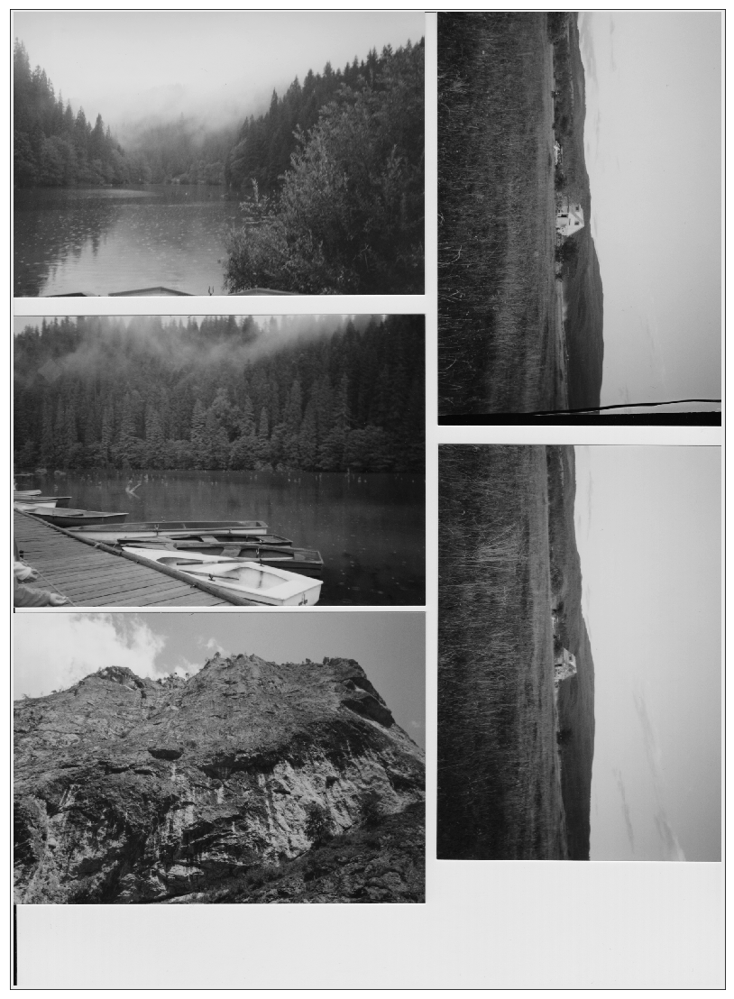

In [50]:
bw = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(bw, cmap = 'gray')
_ = plt.xticks([]), plt.yticks([])
plt.show()

## Blur the image

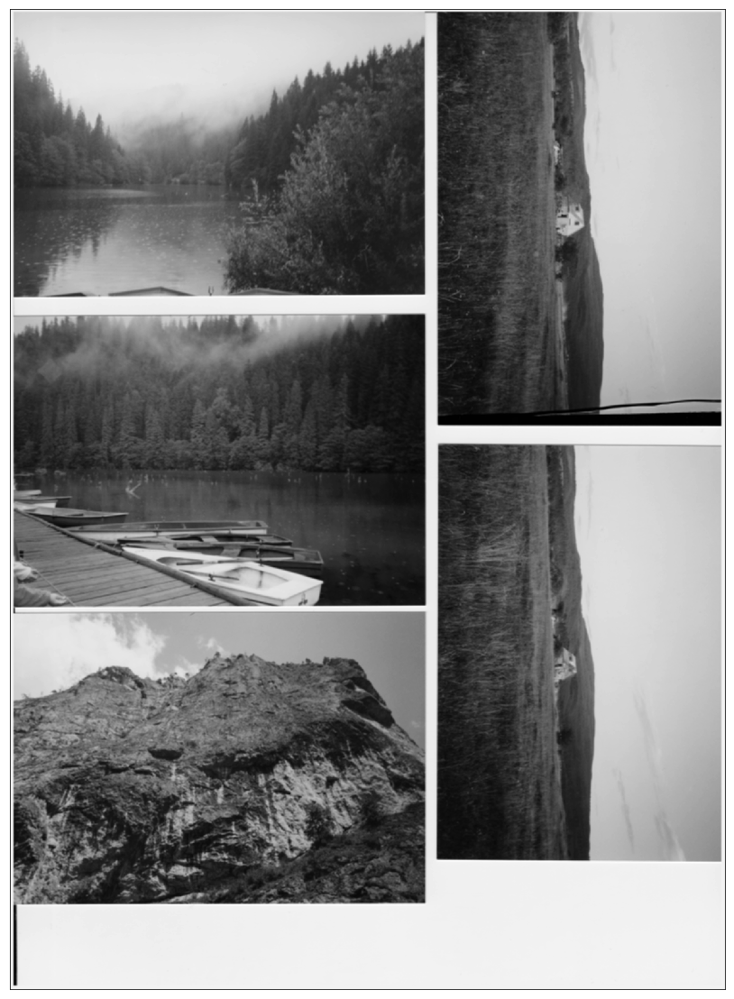

In [51]:
bw_blur = cv2.blur(bw, (5,5))

plt.imshow(bw_blur, cmap = 'gray')
_ = plt.xticks([]), plt.yticks([])
plt.show()

## Detect edges with Canny

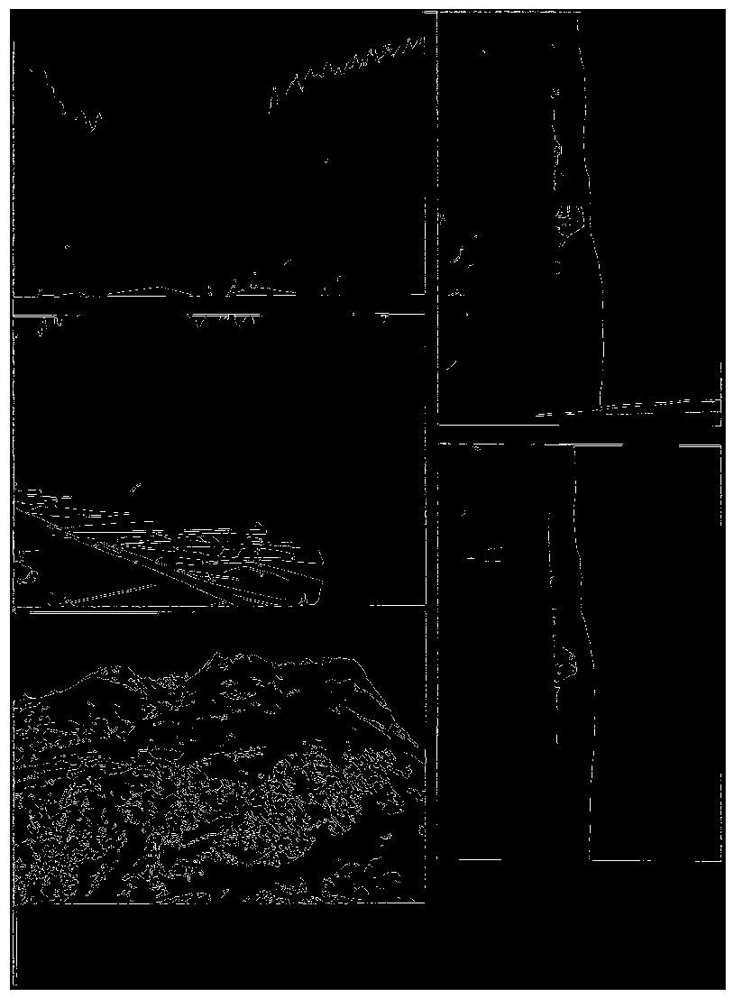

In [52]:
bw_canny = cv2.Canny(bw_blur, 50, 120, apertureSize=3)

plt.imshow(bw_canny, cmap = 'gray', )
_ = plt.xticks([]), plt.yticks([])
plt.show()

## Detect straight lines 

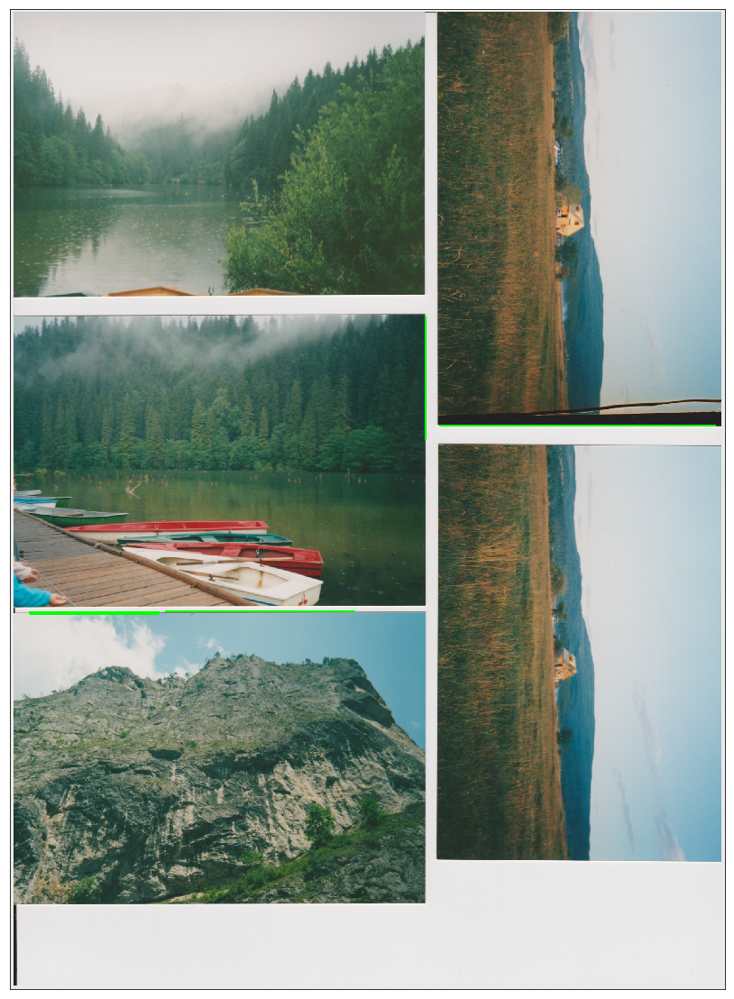

In [53]:
lines = cv2.HoughLinesP(bw_canny, 1, math.pi/180, 70, minLineLength=300, maxLineGap=5)

src_lines = img.copy()    
for line in lines:
    x1,y1,x2,y2 = line[0]
    cv2.line(src_lines, (x1,y1), (x2,y2), GREEN, 3)
    
plt.imshow(cv2.cvtColor(src_lines, cv2.COLOR_BGR2RGB))
_ = plt.xticks([]), plt.yticks([])
plt.show()

# Apply closing

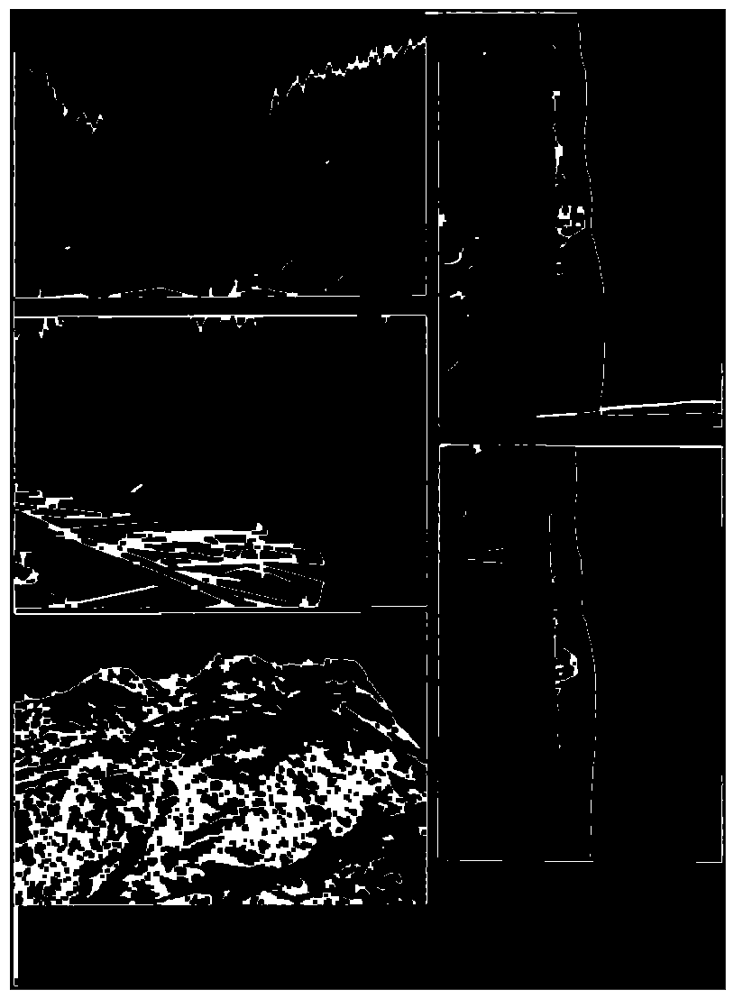

In [54]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (4, 4))
closed = cv2.morphologyEx(bw_canny, cv2.MORPH_CLOSE, kernel, iterations=3)

plt.imshow(closed, cmap = 'gray')
_ = plt.xticks([]), plt.yticks([])
plt.show()

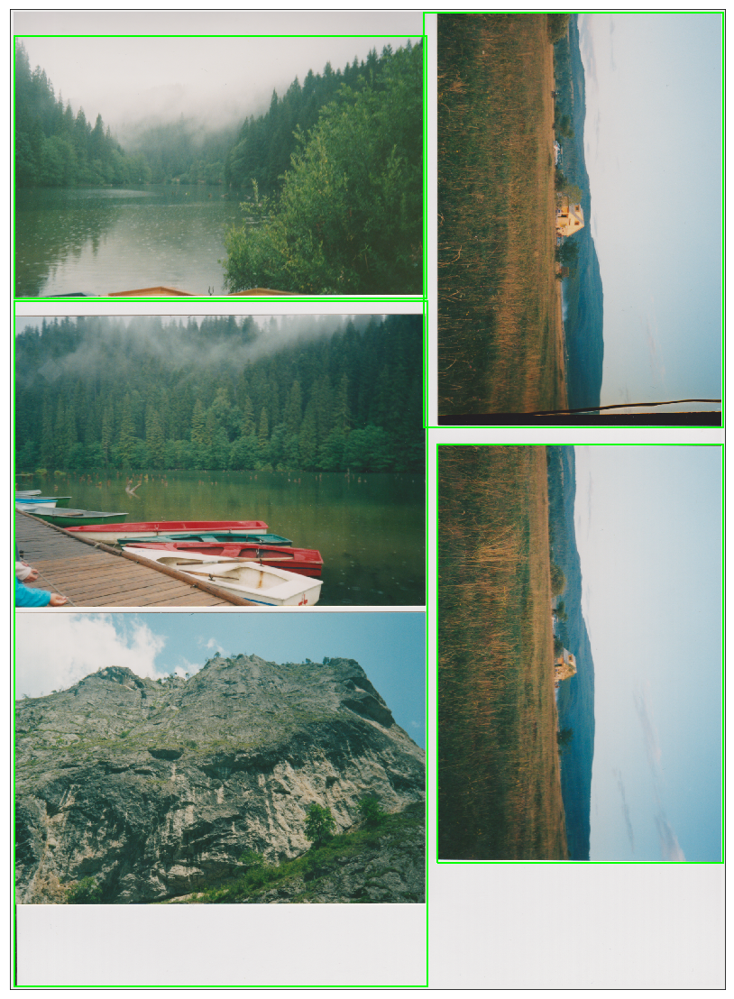

In [55]:
_, contours, _ = cv2.findContours(closed.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

bounds = img.copy()

for c in contours:
    #peri = cv2.arcLength(c, True)
    #approx = cv2.approxPolyDP(c, 0.02 * peri, True)
    #cv2.drawContours(bounds, [approx], -1, (0, 255, 0), 2)
    x,y,w,h = cv2.boundingRect(c)
    if w > 200 and h > 200:
        cv2.rectangle(bounds, (x,y), (x+w,y+h), GREEN, 3)

plt.imshow(cv2.cvtColor(bounds, cv2.COLOR_BGR2RGB))
_ = plt.xticks([]), plt.yticks([])
plt.show()

## Using thresholds

Instead of Canny edge detection, we can use adaptive thresholding to create a binary image from our source. The edges of the pictures are much more pronounced with this method.

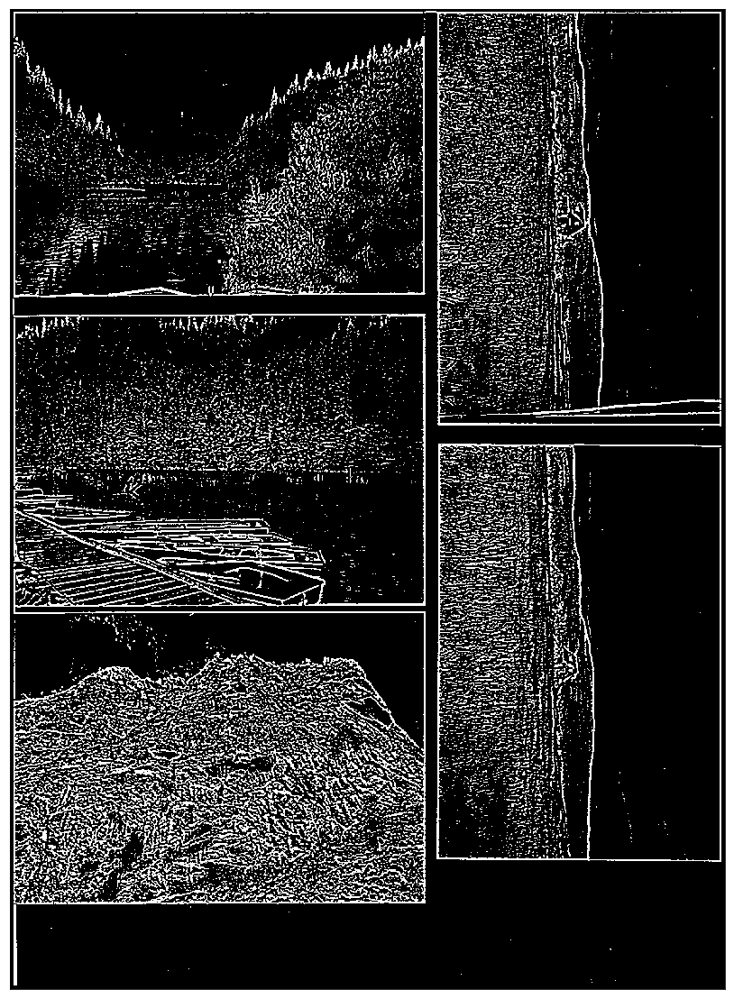

In [56]:
t = cv2.adaptiveThreshold(bw_blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY_INV, 11, 2)
    
plt.imshow(th, cmap = 'gray')
_ = plt.xticks([]), plt.yticks([])
plt.show()

## find straight lines in the image

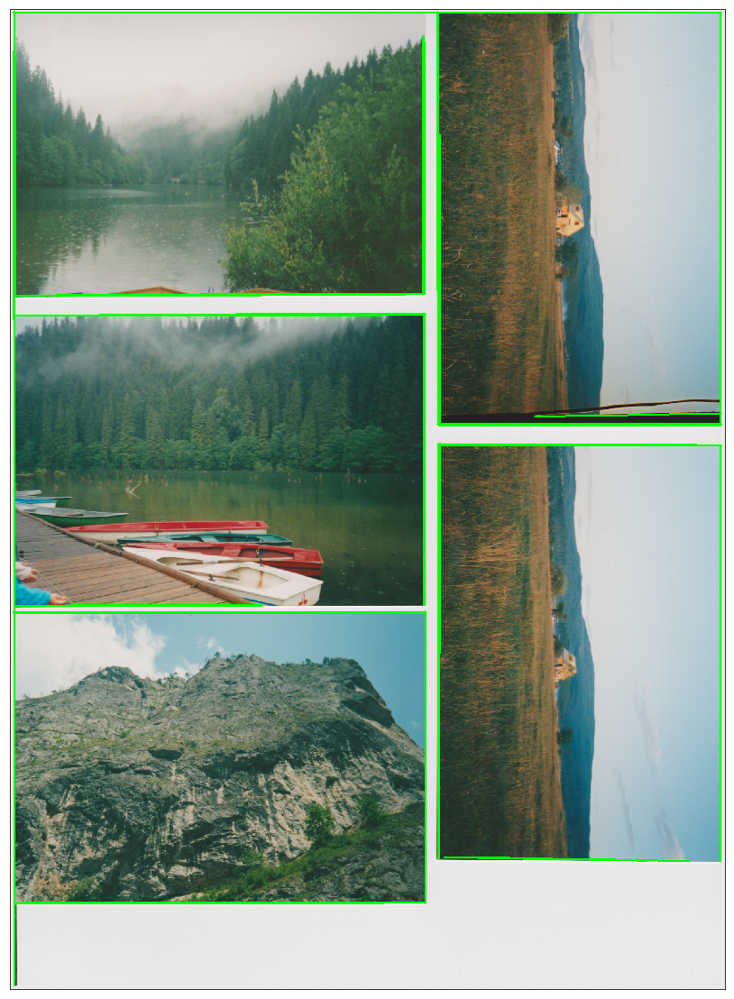

In [57]:
lines = cv2.HoughLinesP(th, 1, math.pi/180, 70, minLineLength=500, maxLineGap=8)

src_lines = img.copy()

for line in lines:
    x1,y1,x2,y2 = line[0]
    cv2.line(src_lines, (x1,y1), (x2,y2), GREEN, 3)
    
plt.imshow(cv2.cvtColor(src_lines, cv2.COLOR_BGR2RGB))
_ = plt.xticks([]), plt.yticks([])
plt.show()

In [58]:
# Lets see the angle of the lines we found 
for line in lines:
    x1,y1,x2,y2 = line[0]
    print(cv2.fastAtan2(y1 - y2, x1 - x2))


90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
90.0
180.0
90.0
90.0
90.0
180.0
90.0
90.0
180.0
90.0
90.0
90.0
180.0
180.0
180.0
180.0
180.0
180.0
180.99269104003906
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.0
180.9271697998047
180.0
180.0
180.0
90.0
180.0
180.0
180.0
180.0
90.0
180.0
180.0
180.0
178.99119567871094
180.0


## erode the noise and the artifacts connecting photos

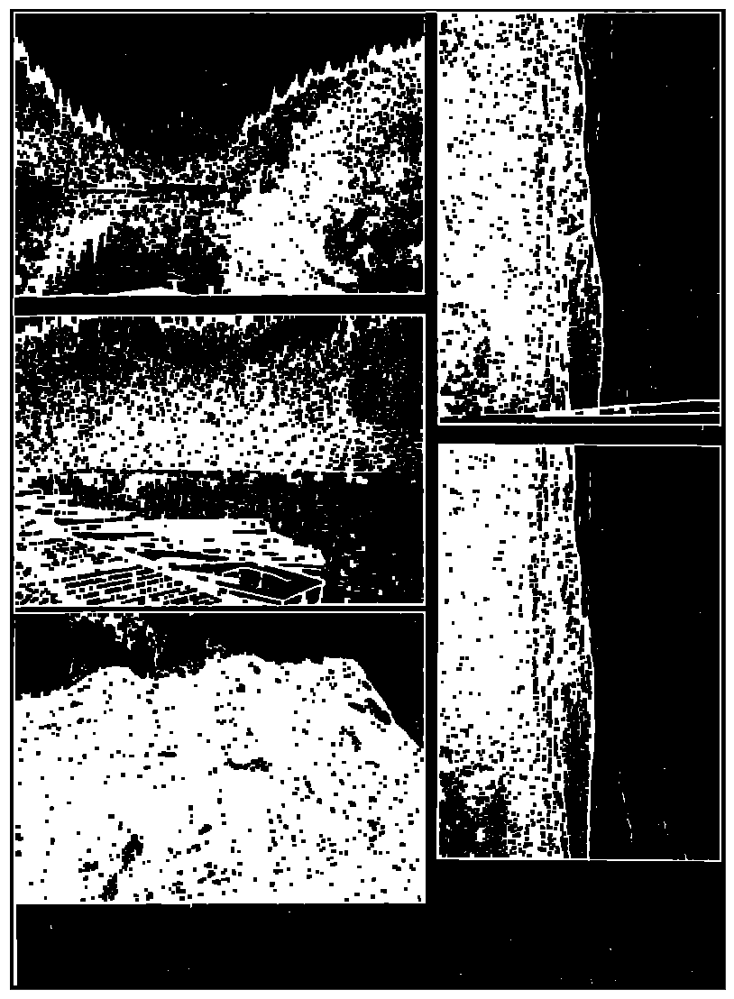

In [59]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))

eroded = cv2.morphologyEx(th, cv2.MORPH_CLOSE, kernel, iterations=4)
# eroded = cv2.erode(bw_canny, kernel)

# eroded = cv2.dilate(bw_canny, kernel)
# eroded = cv2.erode(th, kernel)

plt.imshow(eroded, cmap = 'gray')
_ = plt.xticks([]), plt.yticks([])
plt.show()


## Cutting the image 

Instead of finding rectalnges. Try to find lines where the image can be cut into two pieces and repeat the process.

In [60]:
a = eroded.sum(axis=0)
candidates = np.where(a < 255 * 13)[0]
candidates

array([   0,    1,    2,    3,    4,    5,    6,    7, 1139, 1140, 1141,
       1142, 1143, 1144, 1145, 1146, 1147, 1148, 1149, 1150, 1151, 1152,
       1153, 1154, 1155, 1156, 1157, 1158, 1159, 1160, 1161, 1162, 1163,
       1164, 1165, 1166, 1167, 1168, 1949, 1950, 1951, 1952, 1953, 1954,
       1955, 1956, 1957])

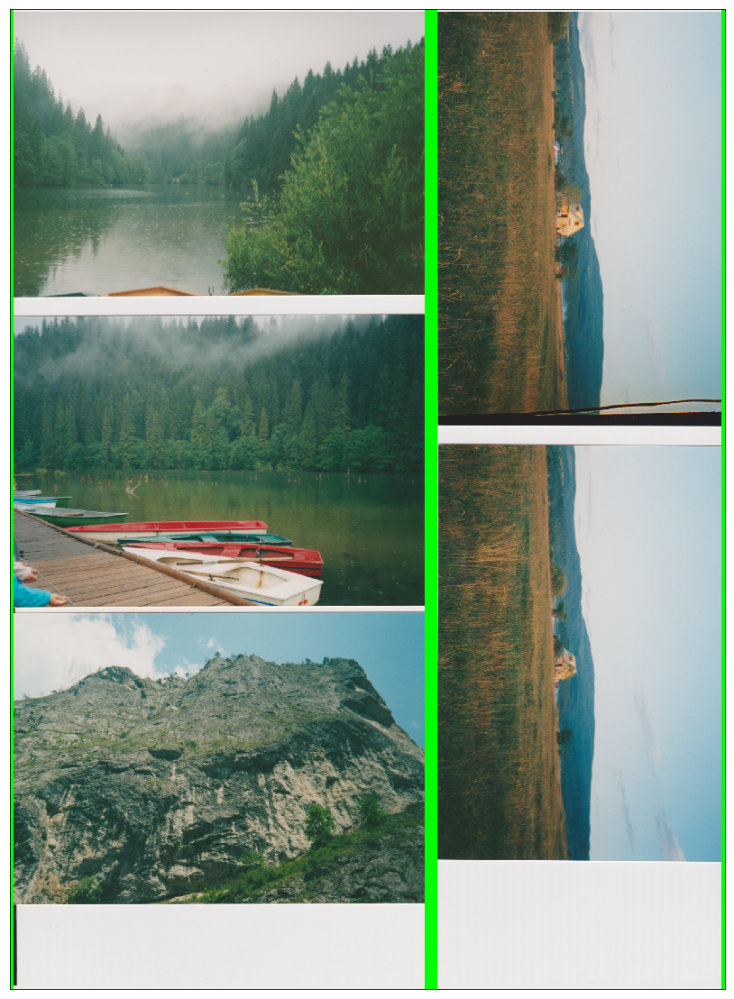

In [61]:
cut_candidates = img.copy()
maxy, maxx = bw.shape

for x in candidates:
    cv2.line(cut_candidates, (x,0), (x,maxy), GREEN, 3)

plt.imshow(cv2.cvtColor(cut_candidates, cv2.COLOR_BGR2RGB))
_ = plt.xticks([]), plt.yticks([])
plt.show()

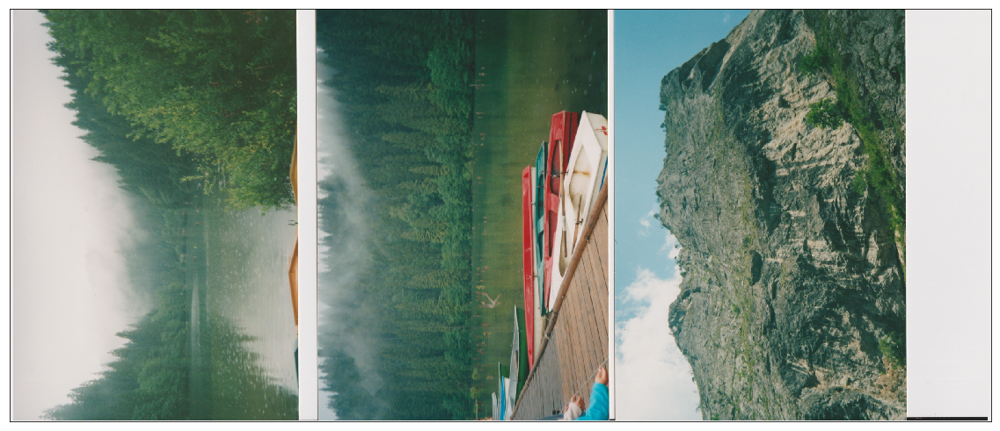

In [62]:
from operator import itemgetter
from itertools import groupby

cuts = []

for k, g in groupby(enumerate(candidates), lambda ix: ix[0] - ix[1]):
    cuts.append(list(map(itemgetter(1), g)))

maxy, maxx = bw.shape


def cut(cutgroups):
    parts = []
    for start, end in zip(cutgroups, cuts[1:]):
        start = max(start)
        end = min(end)
        parts.append(img[0:maxy, start:end])
    return parts

#for i, p in enumerate(cut(cuts)):
#    cv2.imwrite(f'/tmp/test-{i}.png',p)

i = cut(cuts)[0]
i = np.rot90(i)
plt.imshow(cv2.cvtColor(i, cv2.COLOR_BGR2RGB))
_ = plt.xticks([]), plt.yticks([])
plt.show()